In [56]:
import re
import numpy as np
from matplotlib import pyplot as plt
import cmasher as cmr
from scipy.stats import gaussian_kde
from scipy import stats

In [57]:
import os
os.environ["OMP_NUM_THREADS"] = '1'

In [58]:
inf=open('threeplanetsystemsinfo_strict.csv','r')
lines=inf.readlines()
multis=[]
for line in lines:
    if line==lines[0]:
        colname=re.split(',',line) #Sheet column names
    else:
        div=re.split(',',line)
        multis.append(div)

inf.close()

In [59]:
##Stellar Only

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')

#columns_to_keep = ['kepmag', 'rhostar', 'mstar', 'logg', '[M/H]', 'n', 'min_p', 
#                   'max_p', 'meanper', 'perrange', 'lograngep', 'normstdp', 'meandpp', 
#                   'gapc', 'gini', 'qdisp', 'meanzeta', 'subearth', 'supearth', 'subnep', 
#                   'nepplus', 'N_first', 'N_second', 'min_abs_delta', 'med_abs_delta']  # all summary stats

#columns_to_keep = ['gapc', 'gini', 'qdisp', 'meanzeta', 'min_abs_delta', 'med_abs_delta']  # select summary stats

#columns_to_keep = ['minper', 'maxper', 'meanper', 'perrange', 'lograngep', 'normstdp', 'meandpp', 
#                   'gapc', 'gini', 'qdisp', 'meanzeta', 'min_abs_delta', 'med_abs_delta']  # sans stellar and discrete

#columns_to_keep = ['gapc', 'gini', 'logstd_p', '[M/H]', 'normstd_p']  # manhandling for a good radius dispersion plot
columns_to_keep = ['kepmag', 'rhostar', 'mstar', 'teff', '[M/H]']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,kepmag,rhostar,mstar,teff,[M/H]
0,907,15.223,2.26922,0.89,5492,-0.054
1,1236,15.609,0.61840,1.00,5707,0.028
2,528,14.977,1.15812,0.89,5446,0.039
3,1598,14.279,2.04952,0.85,5448,-0.113
4,935,15.237,0.85909,1.04,6091,-0.080


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\2315030889.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


Group 1:  [1.279, 2.531, 2.597, 2.505, 2.846, 3.971, 3.556, 2.931, 2.394, 2.369, 2.713, 1.15, 2.767, 2.136, 1.888, 5.336, 5.05, 3.908, 1.007, 2.889, 1.333, 1.06, 1.237, 1.225, 1.876, 2.403, 1.276, 1.554, 1.266, 1.206, 1.441, 2.313, 2.406, 1.903, 2.423, 2.252, 2.641, 2.29, 2.374, 3.399, 3.64, 7.102, 2.908, 1.71, 0.807, 2.815, 0.868, 2.503, 2.839, 3.46, 2.769, 1.387, 1.27, 2.113, 1.548, 1.509, 2.273, 2.03, 2.152, 2.612, 2.919, 2.172, 2.728, 3.94, 5.09, 1.533, 2.783, 2.537, 2.387, 5.9, 2.298, 2.526, 2.336, 0.906, 1.317, 3.01, 1.57, 1.581, 2.895, 1.596, 3.859, 10.242, 6.105, 1.698, 1.786, 1.363, 2.221, 1.427, 2.482, 2.322, 1.819, 3.448, 8.619, 2.375, 2.265, 2.63, 1.647, 2.197, 3.58, 5.004, 1.7, 2.649, 3.532, 8.914, 3.021, 1.399, 2.623, 2.392, 3.652, 2.47, 2.02, 2.242, 2.689, 2.128, 1.447, 2.522, 2.568, 2.272, 2.788, 2.269, 1.611, 2.236, 2.153, 2.467, 1.86, 1.694, 1.631, 1.593, 2.503, 2.403, 2.736, 1.34, 1.444, 2.837, 3.196, 0.795, 2.384, 1.078, 2.622, 1.29, 2.029, 2.133, 2.168, 1.778, 1.58

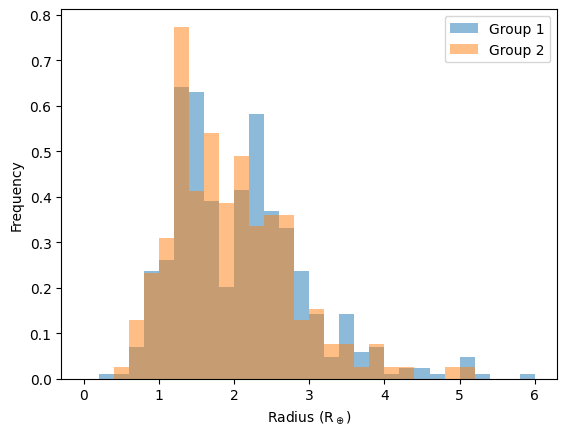

In [60]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_em_group1 = []
r_em_group2 = []
r_ep_group1 = []
r_ep_group2 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])

print('Group 1: ', r_group1)
print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()




KS-2samp pval: 0.05335497842384119


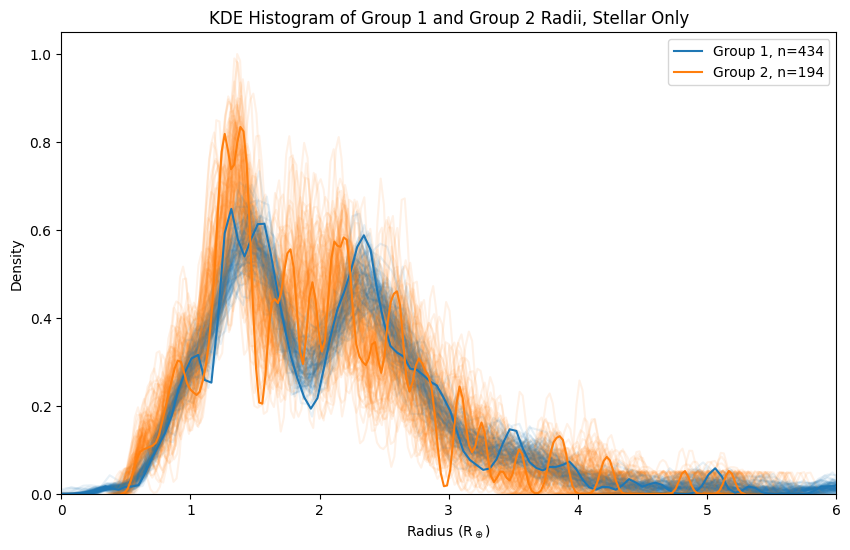

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Stellar Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

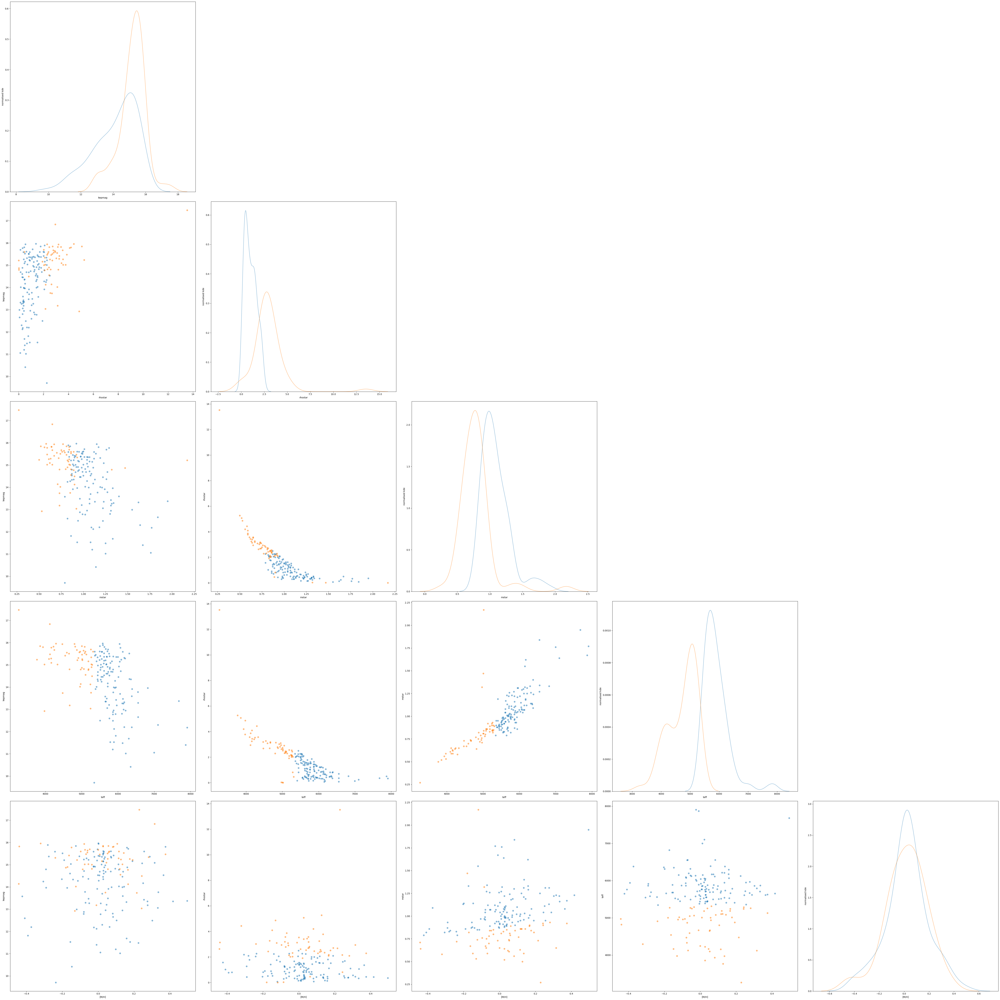

In [62]:
N = len(columns_to_keep)

fig, axes = plt.subplots(N, N, figsize=(60, 60))

# Iterate over each subplot and plot some data
for i in range(N):
    for j in range(N):
        ax=axes[i, j]

        if i<j:
            ax.axis('off')

        if (i>=j):
            I = columns_to_keep[i]
            ax.set_xlabel(I)

        if i == j:
            #histogram
            plt.sca(ax)
            sns.kdeplot(group1[columns_to_keep[i]], label='Group 1', alpha=0.5)
            sns.kdeplot(group2[columns_to_keep[i]], label='Group 2', alpha=0.5)
            plt.ylabel('normalised kde')

        if i>j:
        
            J = columns_to_keep[j]
            ax.set_ylabel(J)

            ax.scatter(group1[I], group1[J], label='Group 1', alpha=0.5)
            ax.scatter(group2[I], group2[J], label='Group 2', alpha=0.5)

# Adjust layout
plt.tight_layout()
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_features_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_features_N%s.pdf' %str(N-1), format='pdf')
plt.show()

C:\Users\drice\AppData\Local\Temp\ipykernel_10872\4145958962.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


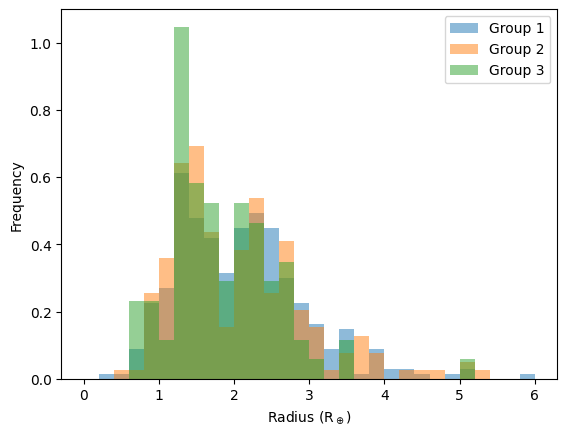

In [63]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()




KS-2samp pval Group 2 and 3: 0.08214286972283237


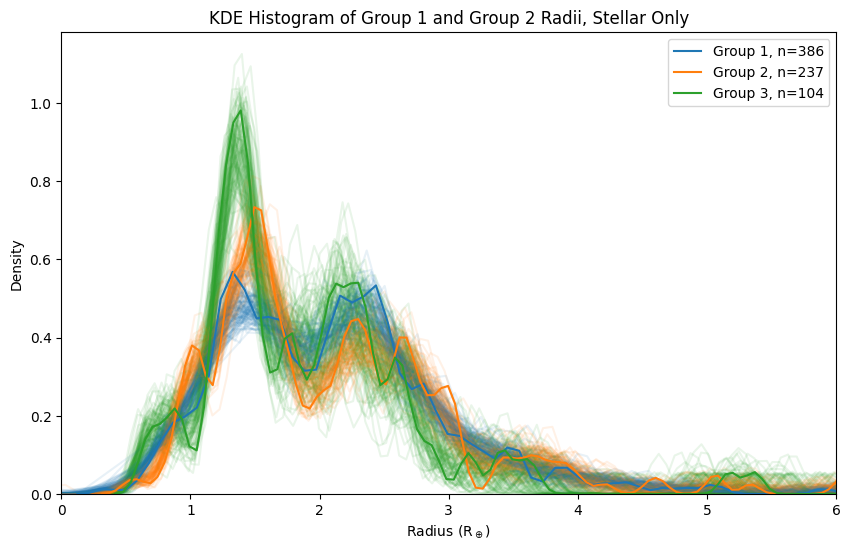

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))


print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Stellar Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

In [64]:
##Gap Compl Only

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')


columns_to_keep = ['gapc']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,gapc
0,907,0.136651
1,1236,0.249686
2,528,0.344717
3,1598,0.613858
4,935,0.002278


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\2811307071.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


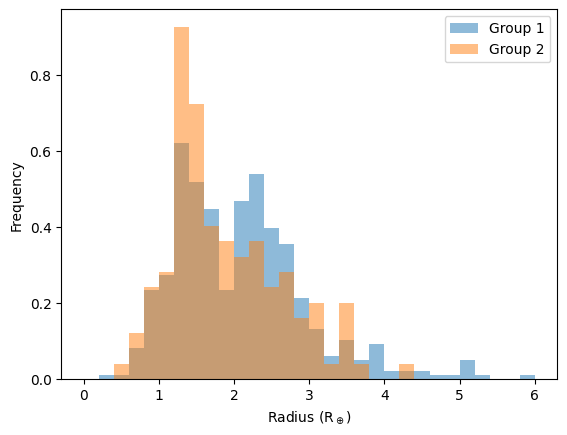

In [65]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_em_group1 = []
r_em_group2 = []
r_ep_group1 = []
r_ep_group2 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()




KS-2samp pval: 0.0533697682862414


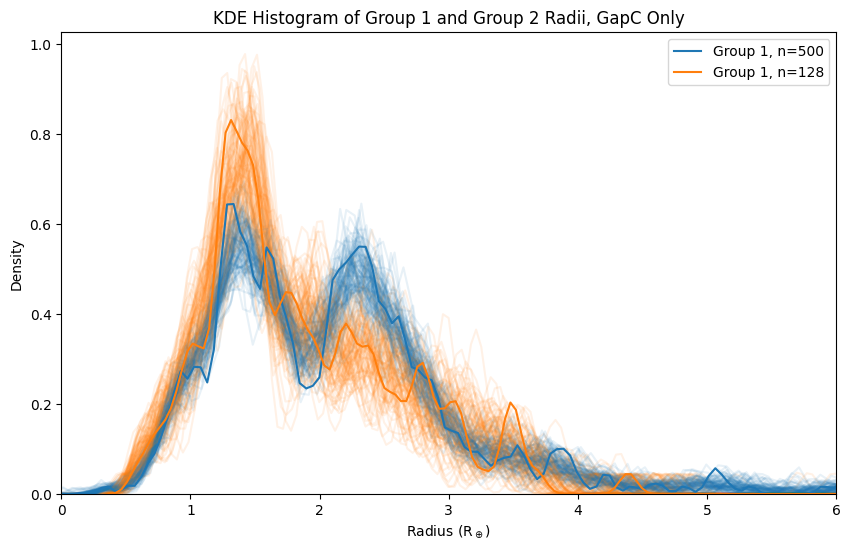

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE histograms
plt.figure(figsize=(10, 6))


print('KS-2samp pval: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 1, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, GapC Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

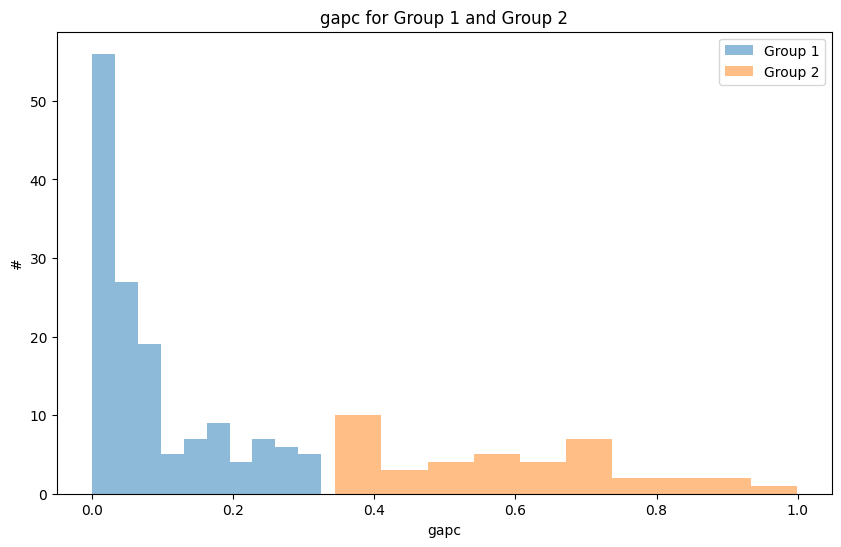

In [67]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.hist(group1['gapc'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.hist(group2['gapc'], label='Group 2', alpha=0.5)

# Add labels and legend
plt.xlabel('gapc')
plt.ylabel('#')
plt.legend()
plt.title('gapc for Group 1 and Group 2')

plt.show()

C:\Users\drice\AppData\Local\Temp\ipykernel_10872\4145958962.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


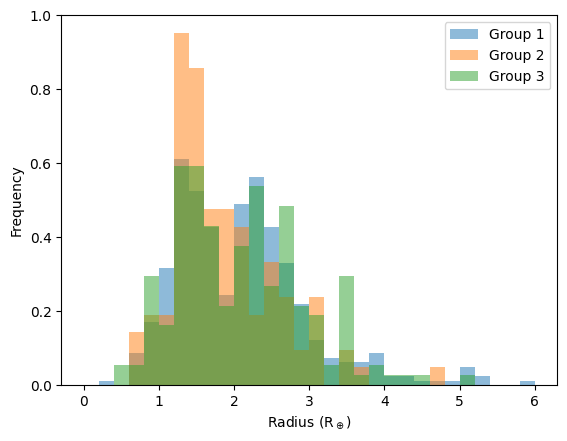

In [20]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()




KS-2samp pval Group 1 and 2: 0.00369887036685115
KS-2samp pval Group 2 and 3: 0.008718386708806368
KS-2samp pval Group 1 and 3: 0.585069247747344


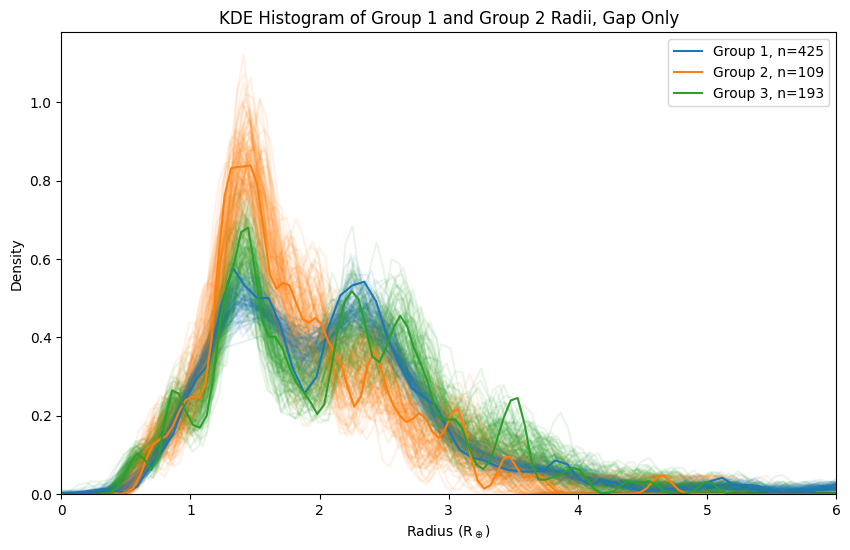

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval Group 1 and 2: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))
print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))
print('KS-2samp pval Group 1 and 3: '+str(stats.ks_2samp(r_group1,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Gap Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

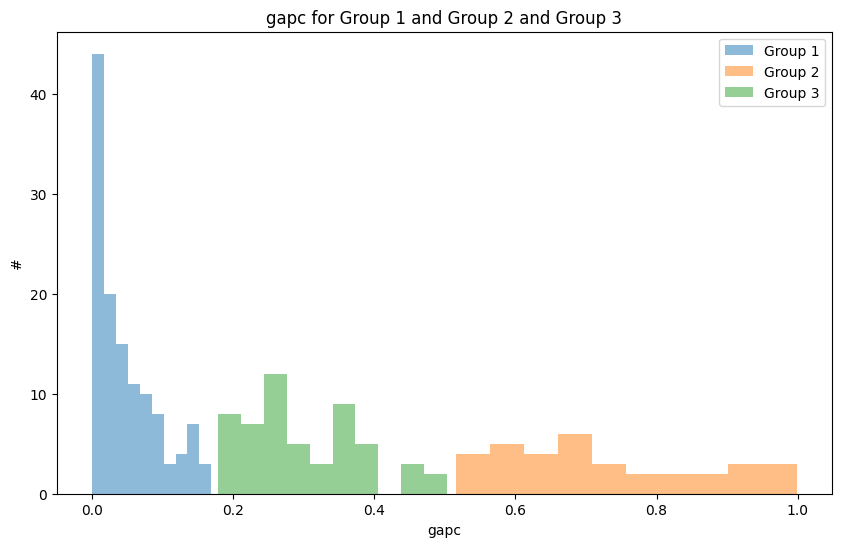

In [22]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.hist(group1['gapc'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.hist(group2['gapc'], label='Group 2', alpha=0.5)

plt.hist(group3['gapc'], label='Group 3', alpha=0.5)

# Add labels and legend
plt.xlabel('gapc')
plt.ylabel('#')
plt.legend()
plt.title('gapc for Group 1 and Group 2 and Group 3')

plt.show()

In [23]:
##Gini Only

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')


columns_to_keep = ['gini']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,gini
0,41,0.194061
1,70,0.252481
2,85,0.324268
3,94,0.087133
4,111,0.027133


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\112666094.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


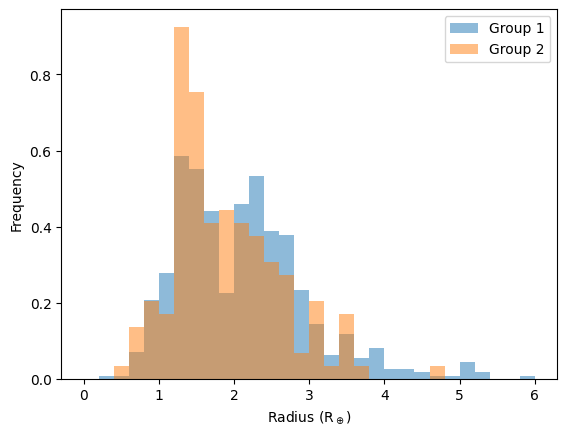

In [24]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_em_group1 = []
r_em_group2 = []
r_ep_group1 = []
r_ep_group2 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()



KS-2samp pval: 0.02152207236850849


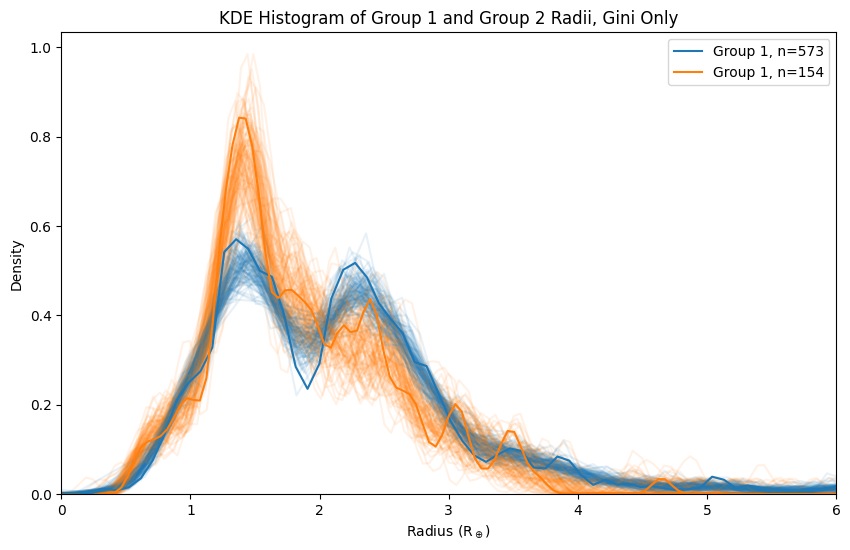

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE histograms
plt.figure(figsize=(10, 6))


print('KS-2samp pval: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 1, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Gini Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

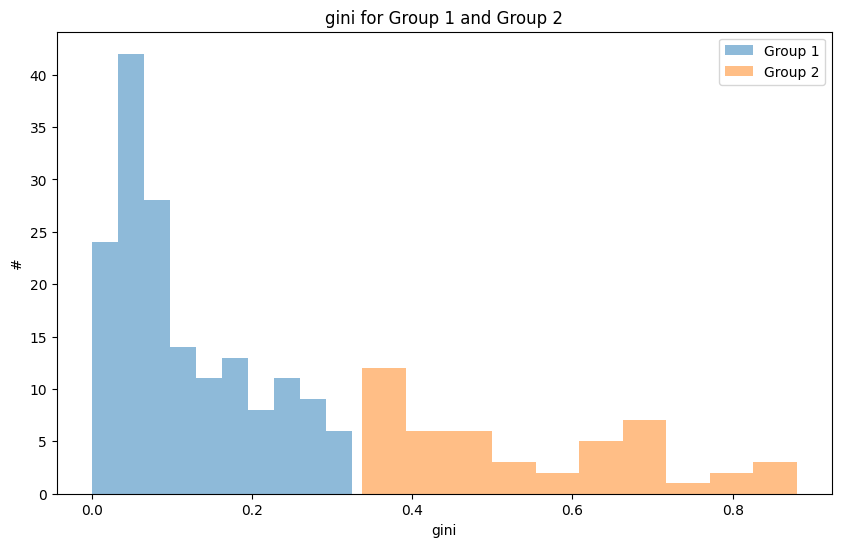

In [26]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.hist(group1['gini'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.hist(group2['gini'], label='Group 2', alpha=0.5)

# Add labels and legend
plt.xlabel('gini')
plt.ylabel('#')
plt.legend()
plt.title('gini for Group 1 and Group 2')

plt.show()

In [27]:
##Gap and Gini Only

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')


columns_to_keep = ['gapc','gini']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,gapc,gini
0,41,0.181007,0.194061
1,70,0.244135,0.252481
2,85,0.676441,0.324268
3,94,0.024652,0.087133
4,111,0.004218,0.027133


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\112666094.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


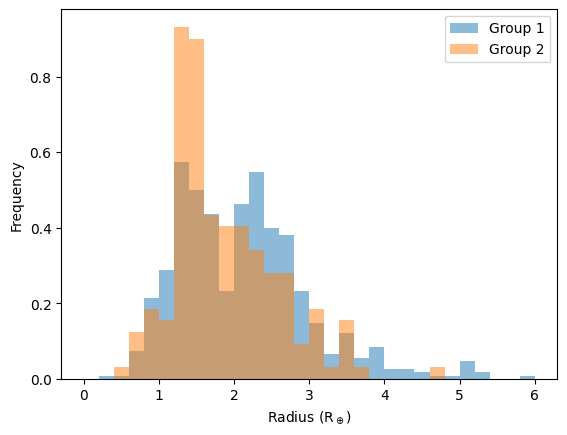

In [28]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_em_group1 = []
r_em_group2 = []
r_ep_group1 = []
r_ep_group2 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()



KS-2samp pval: 0.0006990672621496898


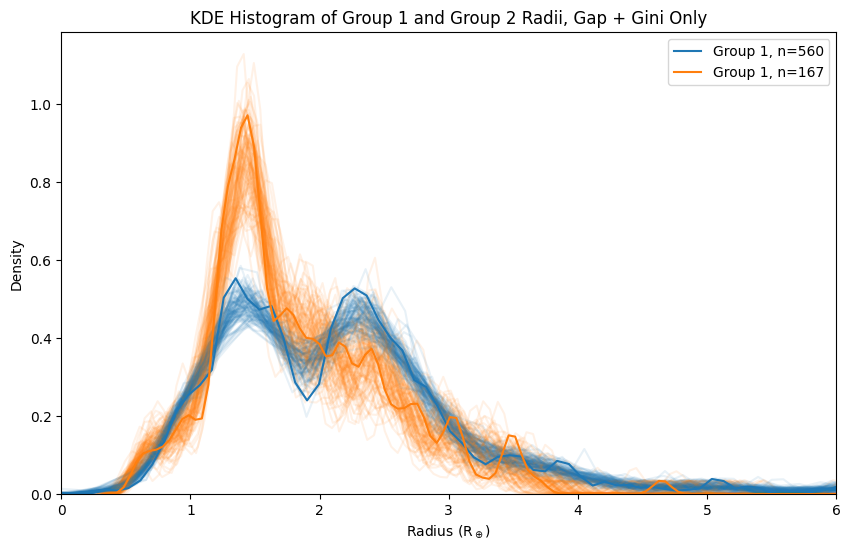

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE histograms
plt.figure(figsize=(10, 6))


print('KS-2samp pval: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 1, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Gap + Gini Only')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

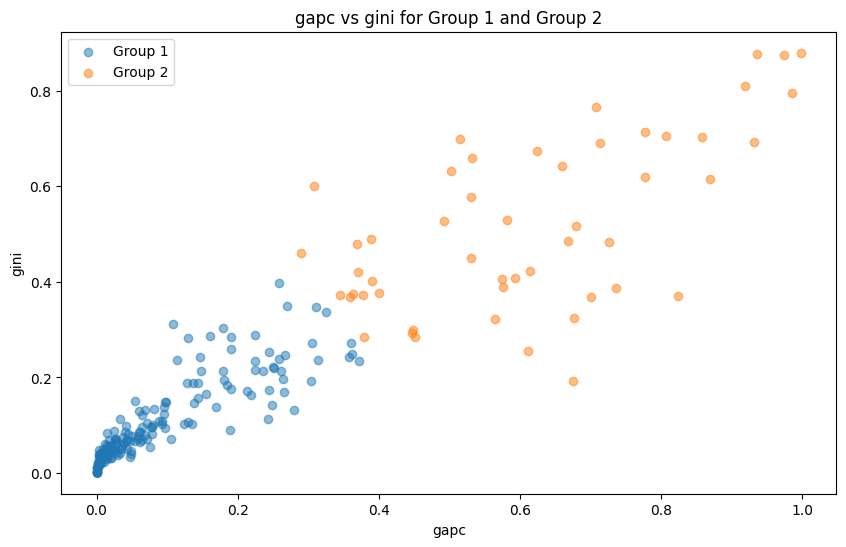

In [31]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.scatter(group1['gapc'], group1['gini'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.scatter(group2['gapc'], group2['gini'], label='Group 2', alpha=0.5)

# Add labels and legend
plt.xlabel('gapc')
plt.ylabel('gini')
plt.legend()
plt.title('gapc vs gini for Group 1 and Group 2')
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_CvG_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_CvG_N%s.pdf' %str(N-1), format='pdf')
plt.show()

In [79]:
##All Architecture

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')

#,'range_p','log_range_p'
columns_to_keep = ['min_p','max_p','normstd_p','mean_dpp','gapc','gini','logstd_p','min_abs_delta','med_abs_delta']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,min_p,max_p,normstd_p,mean_dpp,gapc,gini,logstd_p,min_abs_delta,med_abs_delta
0,238,17.232372,362.998290,1.185558,6.573448,0.986051,0.795450,0.519424,0.032764,1.782674
1,2086,7.132950,335.519854,1.554575,9.261176,0.973756,0.875426,0.777491,0.000313,0.000528
2,351,7.008236,331.597307,1.011477,0.884835,0.258313,0.238610,0.164078,0.004617,0.019048
3,701,5.714890,267.284615,1.181257,2.139690,0.369961,0.420437,0.260149,0.026718,0.090258
4,518,13.981795,247.354680,1.018527,3.384315,0.129382,0.282221,0.127269,0.048990,0.461438


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\112666094.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


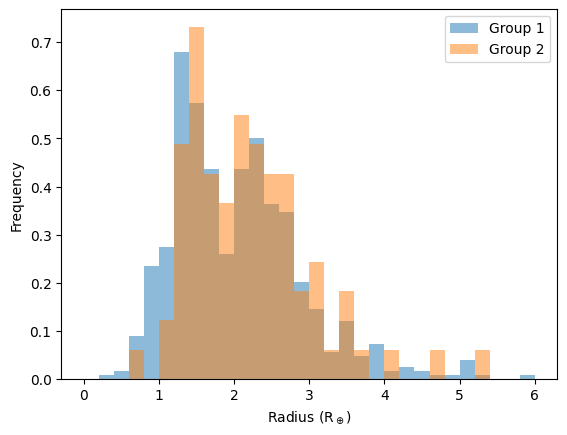

In [80]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_em_group1 = []
r_em_group2 = []
r_ep_group1 = []
r_ep_group2 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()



KS-2samp pval: 0.016589966434207085


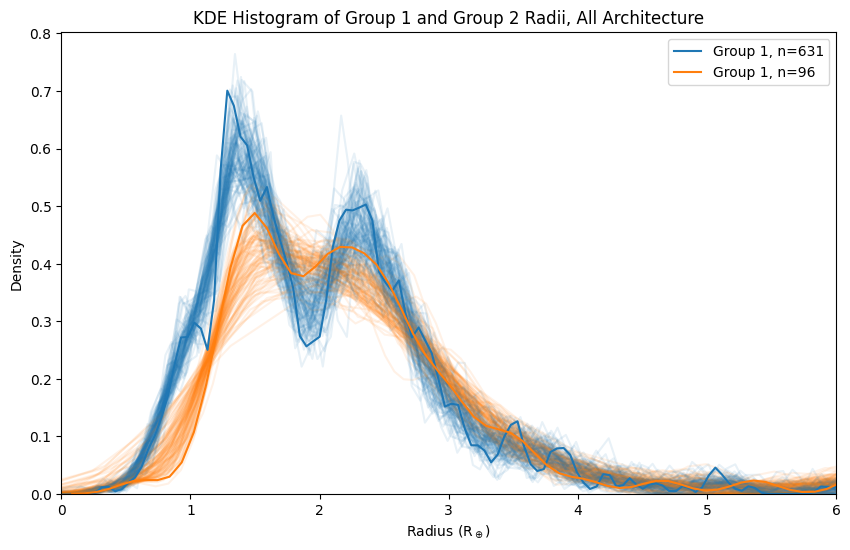

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE histograms
plt.figure(figsize=(10, 6))


print('KS-2samp pval: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 1, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, All Architecture')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

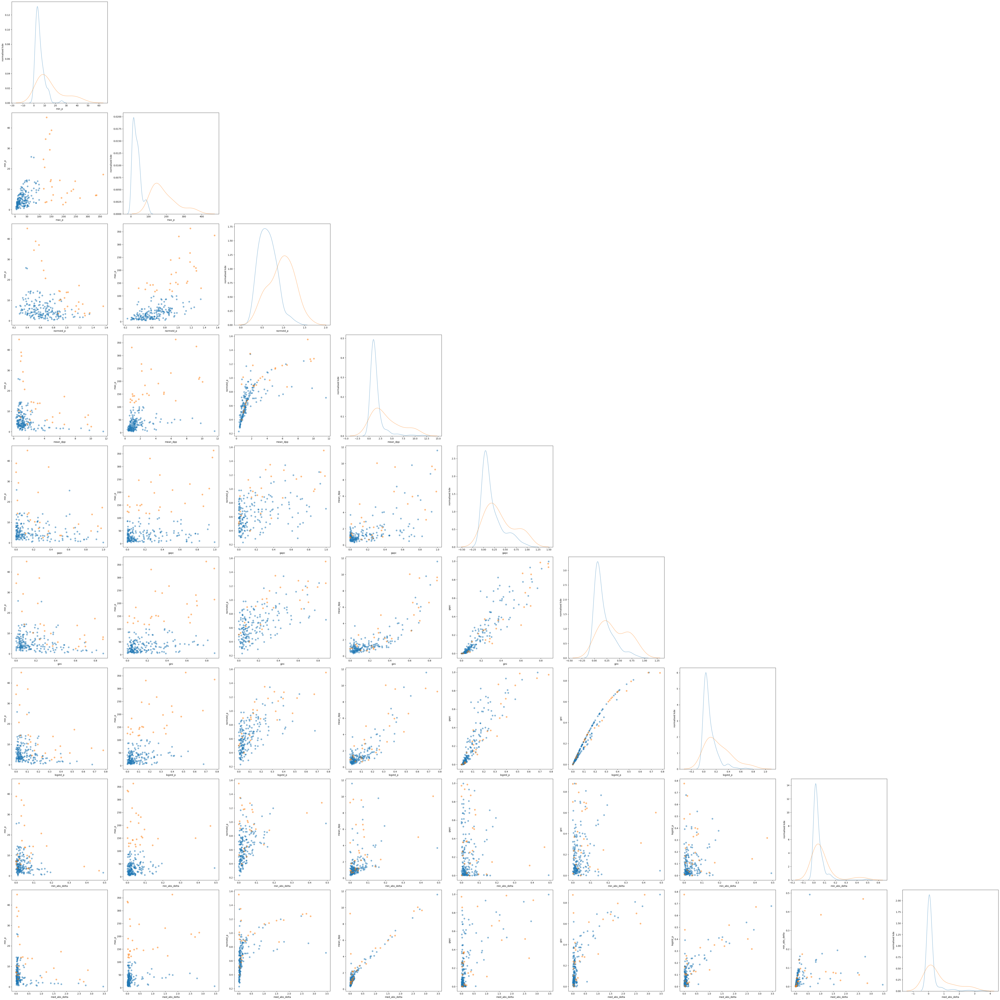

In [82]:
N = len(columns_to_keep)

fig, axes = plt.subplots(N, N, figsize=(60, 60))

# Iterate over each subplot and plot some data
for i in range(N):
    for j in range(N):
        ax=axes[i, j]

        if i<j:
            ax.axis('off')

        if (i>=j):
            I = columns_to_keep[i]
            ax.set_xlabel(I)

        if i == j:
            #histogram
            plt.sca(ax)
            sns.kdeplot(group1[columns_to_keep[i]], label='Group 1', alpha=0.5)
            sns.kdeplot(group2[columns_to_keep[i]], label='Group 2', alpha=0.5)
            plt.ylabel('normalised kde')

        if i>j:
        
            J = columns_to_keep[j]
            ax.set_ylabel(J)

            ax.scatter(group1[I], group1[J], label='Group 1', alpha=0.5)
            ax.scatter(group2[I], group2[J], label='Group 2', alpha=0.5)

# Adjust layout
plt.tight_layout()
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_features_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_features_N%s.pdf' %str(N-1), format='pdf')
plt.show()

C:\Users\drice\AppData\Local\Temp\ipykernel_10872\4083449428.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


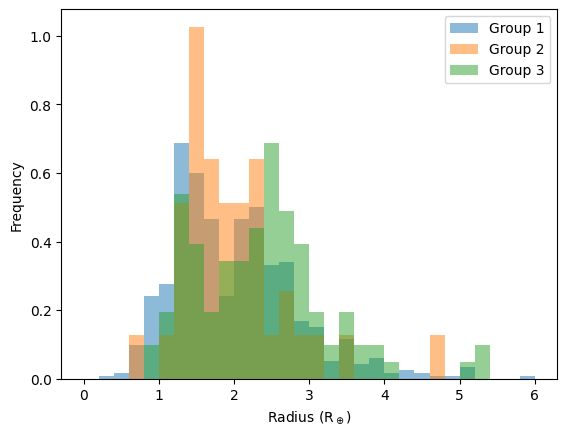

In [83]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


KS-2samp pval Group 1 and 2: 0.3811663998479394
KS-2samp pval Group 2 and 3: 0.008925093254972961
KS-2samp pval Group 1 and 3: 5.932305636649058e-06


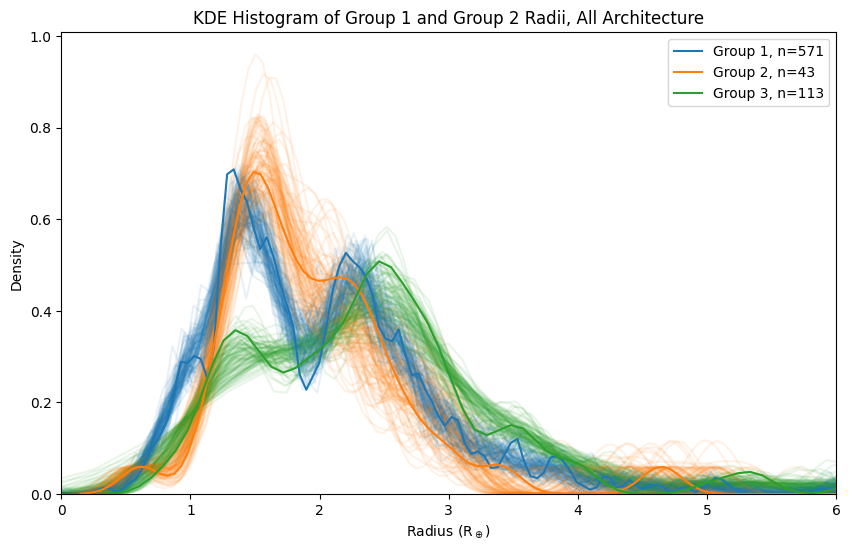

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval Group 1 and 2: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))
print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))
print('KS-2samp pval Group 1 and 3: '+str(stats.ks_2samp(r_group1,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, All Architecture')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

In [86]:
len(system_radii_group3)

32

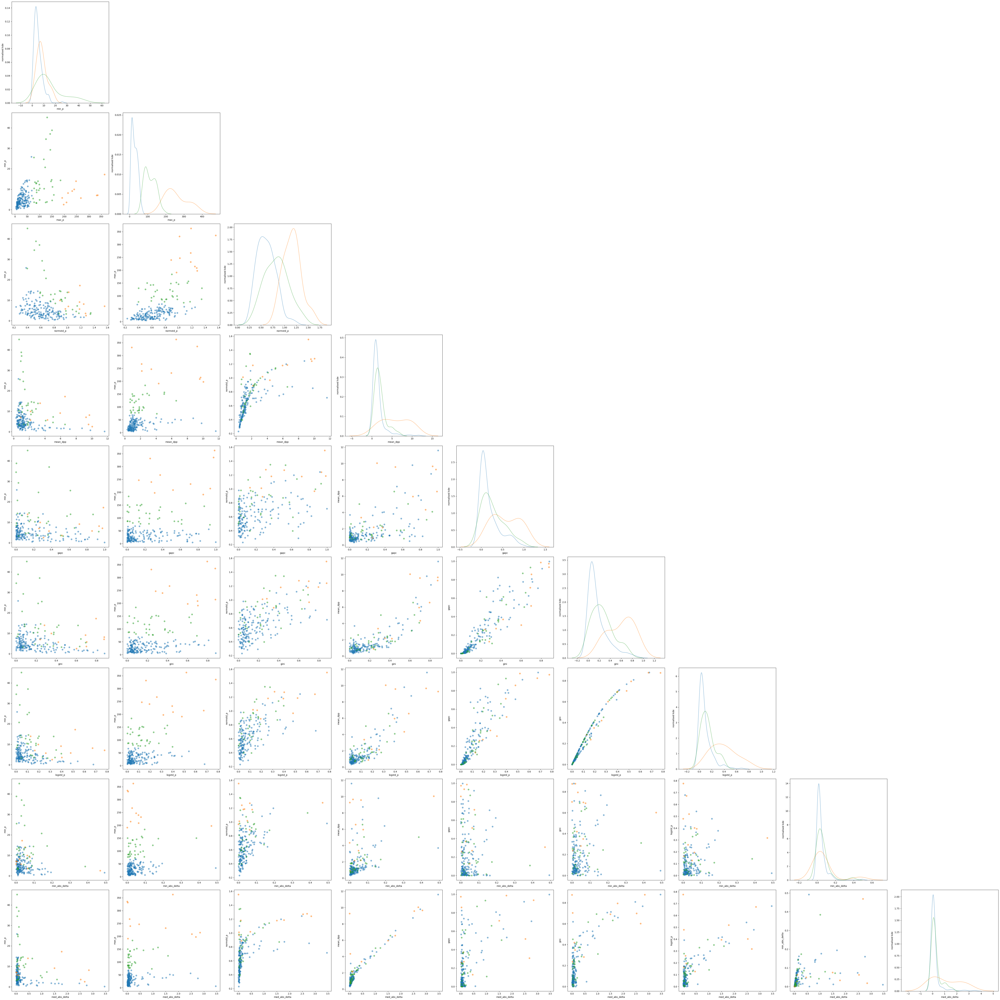

In [87]:
N = len(columns_to_keep)

fig, axes = plt.subplots(N, N, figsize=(60, 60))

# Iterate over each subplot and plot some data
for i in range(N):
    for j in range(N):
        ax=axes[i, j]

        if i<j:
            ax.axis('off')

        if (i>=j):
            I = columns_to_keep[i]
            ax.set_xlabel(I)

        if i == j:
            #histogram
            plt.sca(ax)
            sns.kdeplot(group1[columns_to_keep[i]], label='Group 1', alpha=0.5)
            sns.kdeplot(group2[columns_to_keep[i]], label='Group 2', alpha=0.5)
            sns.kdeplot(group3[columns_to_keep[i]], label='Group 2', alpha=0.5)
            plt.ylabel('normalised kde')

        if i>j:
        
            J = columns_to_keep[j]
            ax.set_ylabel(J)

            ax.scatter(group1[I], group1[J], label='Group 1', alpha=0.5)
            ax.scatter(group2[I], group2[J], label='Group 2', alpha=0.5)
            ax.scatter(group3[I], group3[J], label='Group 3', alpha=0.5)

# Adjust layout
plt.tight_layout()
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_features_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_features_N%s.pdf' %str(N-1), format='pdf')
plt.show()

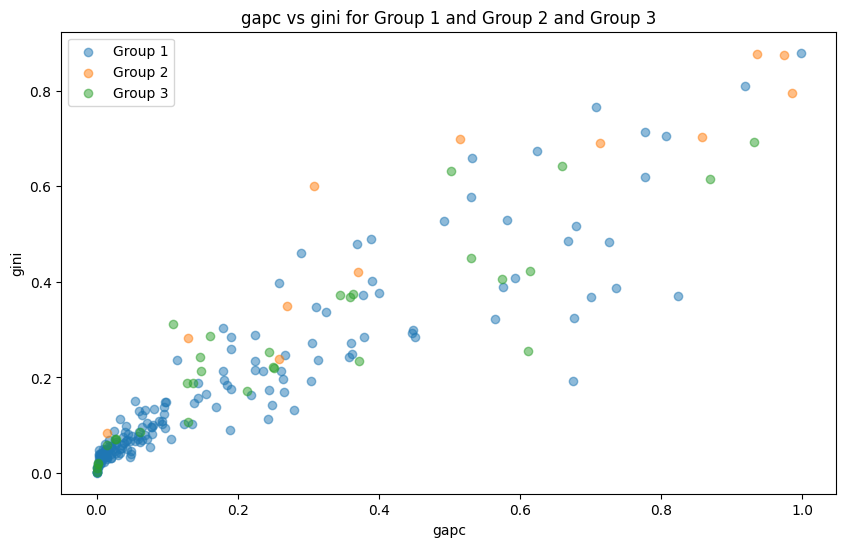

In [42]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.scatter(group1['gapc'], group1['gini'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.scatter(group2['gapc'], group2['gini'], label='Group 2', alpha=0.5)

# Plot for group 3
plt.scatter(group3['gapc'], group3['gini'], label='Group 3', alpha=0.5)

# Add labels and legend
plt.xlabel('gapc')
plt.ylabel('gini')
plt.legend()
plt.title('gapc vs gini for Group 1 and Group 2 and Group 3')
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_CvG_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_CvG_N%s.pdf' %str(N-1), format='pdf')
plt.show()

C:\Users\drice\AppData\Local\Temp\ipykernel_10872\1045012624.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


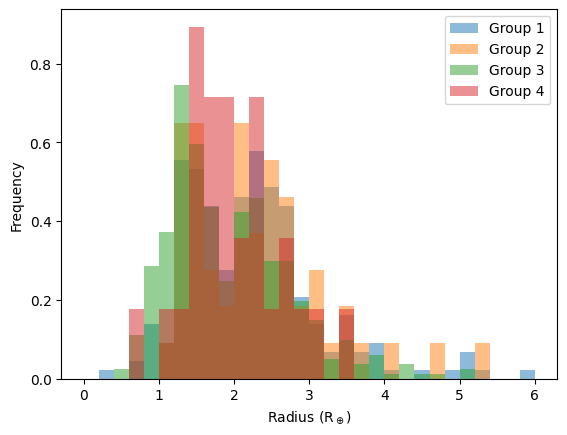

In [43]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]
group4 = summary_stats[labels == 3]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
system_radii_group4 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_group4 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_em_group4 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []
r_ep_group4 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])
            
    elif labels[i] == 3:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group4[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group4.append(r[j])
            r_em_group4.append(r_em[j])
            r_ep_group4.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.hist(r_group4, bins=30, alpha=0.5, label='Group 4', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


KS-2samp pval Group 1 and 2: 0.03387392760978759
KS-2samp pval Group 2 and 3: 0.0002862812079668128
KS-2samp pval Group 1 and 3: 0.0010346331237052638


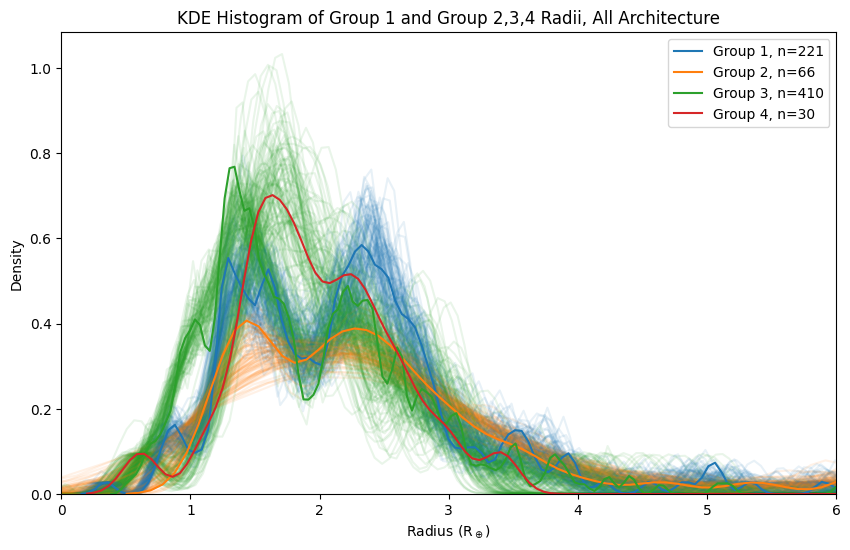

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval Group 1 and 2: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))
print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))
print('KS-2samp pval Group 1 and 3: '+str(stats.ks_2samp(r_group1,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    rdraw_g4=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
    for k in range(len(r_group4)):
        rdraw_g4.append(np.random.normal(r_group4[k],(r_em_group4[k]+r_ep_group4[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)
    sns.kdeplot(rdraw_g4, c='tab:green', bw_adjust=np.median(r_ep_group4),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
sns.kdeplot(r_group4, c='tab:red',label='Group 4, n='+str(len(r_group4)), bw_adjust=np.median(r_ep_group4))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2,3,4 Radii, All Architecture')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

In [45]:
##Some Architecture

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')

#,'range_p','log_range_p'
columns_to_keep = ['min_p','max_p','normstd_p','mean_dpp','gapc']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,min_p,max_p,normstd_p,mean_dpp,gapc
0,41,6.887077,35.333574,0.667945,1.308936,0.181007
1,70,3.696122,77.611343,1.169489,1.299439,0.244135
2,85,2.154910,8.131205,0.457655,1.053467,0.676441
3,94,3.743158,54.320059,0.855645,1.453134,0.024652
4,111,11.427545,51.755360,0.583139,1.128929,0.004218


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\4083449428.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


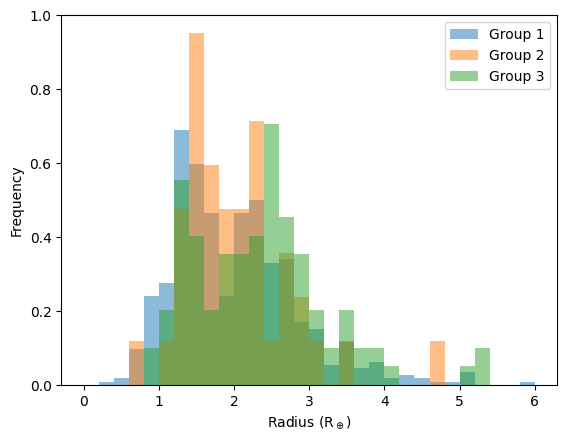

In [46]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


KS-2samp pval Group 1 and 2: 0.2856724199697072
KS-2samp pval Group 2 and 3: 0.020306807944616218
KS-2samp pval Group 1 and 3: 1.02369696103177e-05


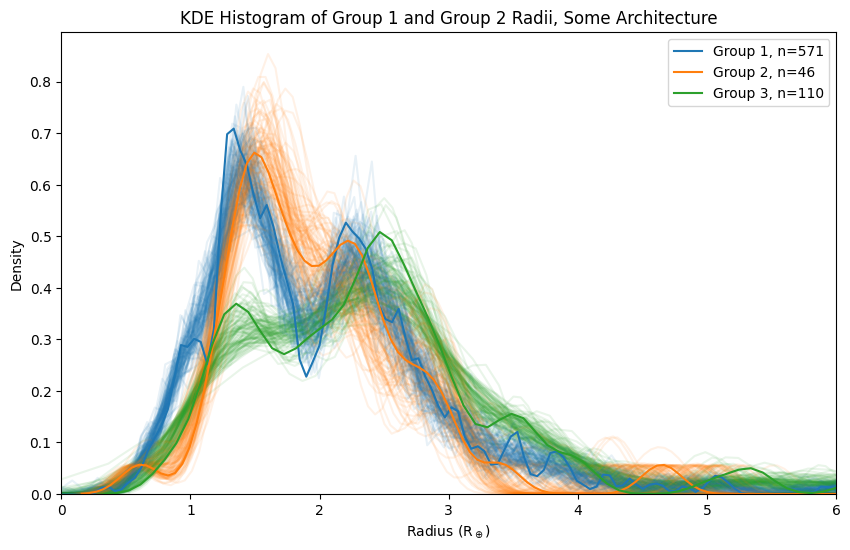

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval Group 1 and 2: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))
print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))
print('KS-2samp pval Group 1 and 3: '+str(stats.ks_2samp(r_group1,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Some Architecture')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()

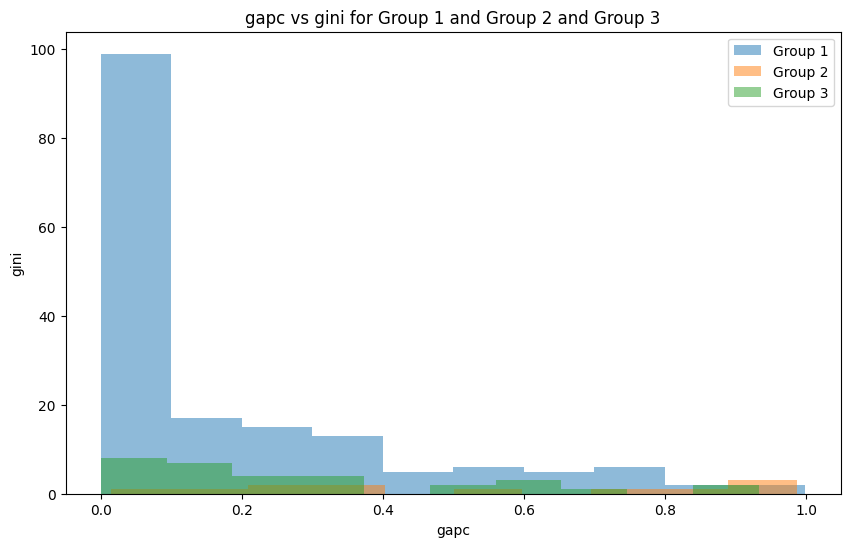

In [49]:
plt.figure(figsize=(10, 6))

# Plot for group 1
plt.hist(group1['gapc'], label='Group 1', alpha=0.5)

# Plot for group 2
plt.hist(group2['gapc'], label='Group 2', alpha=0.5)

# Plot for group 3
plt.hist(group3['gapc'], label='Group 3', alpha=0.5)

# Add labels and legend
plt.xlabel('gapc')
plt.ylabel('gini')
plt.legend()
plt.title('gapc vs gini for Group 1 and Group 2 and Group 3')
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_CvG_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_CvG_N%s.pdf' %str(N-1), format='pdf')
plt.show()

In [50]:
##All Architecture

import pandas as pd

df = pd.read_csv('threeplanetsystemsinfo_strict.csv')

#,'range_p','log_range_p'
columns_to_keep = ['min_r','mean_r','max_r','range_r','std_r','mean_rrat','gini_r']

summary_stats = df[['KOI']+columns_to_keep]
radius_measurements = {}

for i, each in enumerate(df['radius']):
    r_em = df['radius_em'][i]
    r_ep = df['radius_ep'][i]

    radii = [r for r in each.strip('[]').split(' ') if r]
    r_em = [r for r in r_em.strip('[]').split(' ') if r]
    r_ep = [r for r in r_ep.strip('[]').split(' ') if r]

    radii = [float(r) for r in radii]
    r_em = [float(r) for r in r_em]
    r_ep = [float(r) for r in r_ep]

    radius_measurements[str(df['KOI'][i])] = (radii, r_em, r_ep)

summary_stats.head()


,KOI,min_r,mean_r,max_r,range_r,std_r,mean_rrat,gini_r
0,41,1.270,1.689000,2.269,0.999,0.423431,1.230019,0.197158
1,70,0.807,1.740600,2.815,2.008,0.820922,1.788037,0.324658
2,85,1.460,1.872667,2.619,1.159,0.528722,1.190732,0.206301
3,94,1.596,5.450500,10.242,8.646,3.192839,1.889350,0.430908
4,111,2.265,2.423333,2.630,0.365,0.152880,1.057416,0.050206


C:\Users\drice\AppData\Local\Temp\ipykernel_10872\4083449428.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_stats['group'] = labels


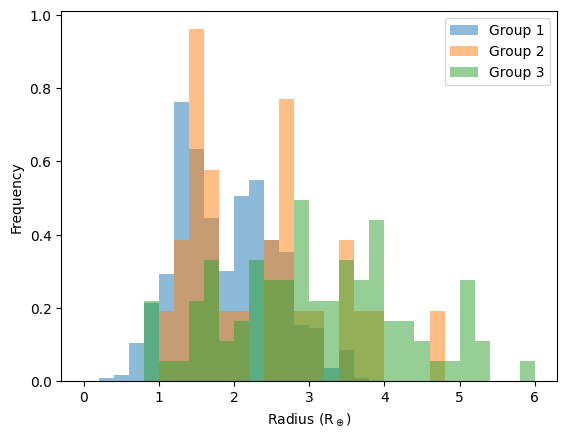

In [53]:
from sklearn.cluster import KMeans
import ast

# Extract the features for clustering

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(summary_stats[columns_to_keep])
labels = kmeans.labels_

# Separate the systems into two groups based on the labels
group1 = summary_stats[labels == 0]
group2 = summary_stats[labels == 1]
group3 = summary_stats[labels == 2]

# add a group label to the radius dataframe
summary_stats['group'] = labels

# dictionaries of radii for the two groups
system_radii_group1 = {}
system_radii_group2 = {}
system_radii_group3 = {}
# array of radii for the two groups
N = len(labels)

r_group1 = []
r_group2 = []
r_group3 = []
r_em_group1 = []
r_em_group2 = []
r_em_group3 = []
r_ep_group1 = []
r_ep_group2 = []
r_ep_group3 = []

for i in range(N):
    if labels[i] == 0:

        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group1[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group1.append(r[j])
            r_em_group1.append(r_em[j])
            r_ep_group1.append(r_ep[j])
        
    elif labels[i] == 1:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group2[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group2.append(r[j])
            r_em_group2.append(r_em[j])
            r_ep_group2.append(r_ep[j])
    
    elif labels[i] == 2:
        radii = radius_measurements[str(df['KOI'][i])]
        r = radii[0]
        r_em = np.abs(radii[1])
        r_ep = radii[2]
        system_radii_group3[i] = (r, r_em, r_ep)
        for j in range(len(r)):
            r_group3.append(r[j])
            r_em_group3.append(r_em[j])
            r_ep_group3.append(r_ep[j])

#print('Group 1: ', r_group1)
#print('Group 2: ', r_group2)


# Plot the radius distributions of the two groups
plt.hist(r_group1, bins=30, alpha=0.5, label='Group 1', range=(0, 6), density=True)
plt.hist(r_group2, bins=30, alpha=0.5, label='Group 2', range=(0, 6), density=True)
plt.hist(r_group3, bins=30, alpha=0.5, label='Group 3', range=(0, 6), density=True)
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


KS-2samp pval Group 1 and 2: 1.0621145607470667e-09
KS-2samp pval Group 2 and 3: 0.0028855061428263874
KS-2samp pval Group 1 and 3: 3.0964606019046706e-26


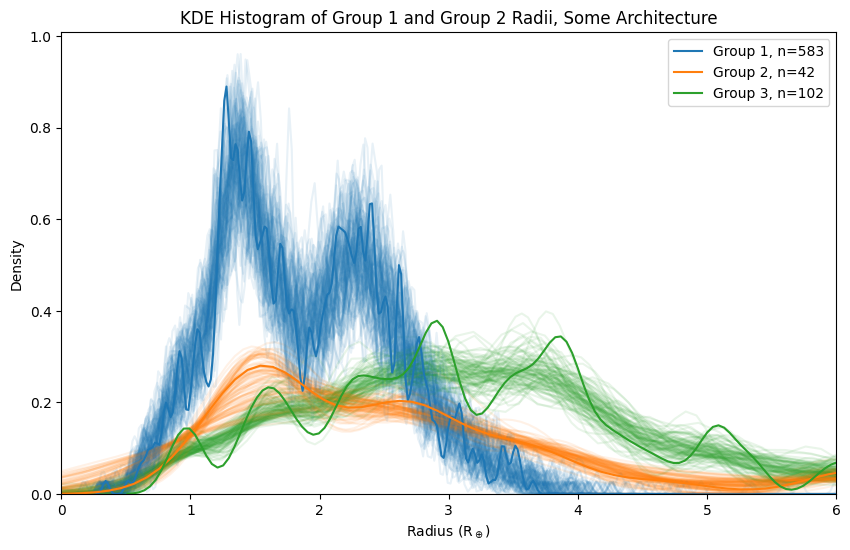

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plot the KDE histograms
plt.figure(figsize=(10, 6))

print('KS-2samp pval Group 1 and 2: '+str(stats.ks_2samp(r_group1,r_group2,)[1]))
print('KS-2samp pval Group 2 and 3: '+str(stats.ks_2samp(r_group2,r_group3,)[1]))
print('KS-2samp pval Group 1 and 3: '+str(stats.ks_2samp(r_group1,r_group3,)[1]))

for i in range(100):
    rdraw_g1=[]
    rdraw_g2=[]
    rdraw_g3=[]
    for j in range(len(r_group1)):
        rdraw_g1.append(np.random.normal(r_group1[j],(r_em_group1[j]+r_ep_group1[j])/2))
    for k in range(len(r_group2)):
        rdraw_g2.append(np.random.normal(r_group2[k],(r_em_group2[k]+r_ep_group2[k])/2))    
    for k in range(len(r_group3)):
        rdraw_g3.append(np.random.normal(r_group3[k],(r_em_group3[k]+r_ep_group3[k])/2)) 
        
    sns.kdeplot(rdraw_g1,c='tab:blue', bw_adjust=np.median(r_ep_group1),alpha=0.1)
    sns.kdeplot(rdraw_g2, c='tab:orange', bw_adjust=np.median(r_ep_group2),alpha=0.1)
    sns.kdeplot(rdraw_g3, c='tab:green', bw_adjust=np.median(r_ep_group3),alpha=0.1)

sns.kdeplot(r_group1, c='tab:blue',label='Group 1, n='+str(len(r_group1)), bw_adjust=np.median(r_ep_group1))
sns.kdeplot(r_group2, c='tab:orange',label='Group 2, n='+str(len(r_group2)), bw_adjust=np.median(r_ep_group2))
sns.kdeplot(r_group3, c='tab:green',label='Group 3, n='+str(len(r_group3)), bw_adjust=np.median(r_ep_group3))
    
# Add labels and legend
plt.xlabel(r'Radius (R$_\oplus$)')
plt.ylabel('Density')
plt.xlim(0, 6)
plt.legend()
plt.title('KDE Histogram of Group 1 and Group 2 Radii, Radius')
N = len(columns_to_keep)
#plt.savefig('Data/kmeans_r_kde_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_r_kde_N%s.pdf' %str(N-1), format='pdf')
plt.show()


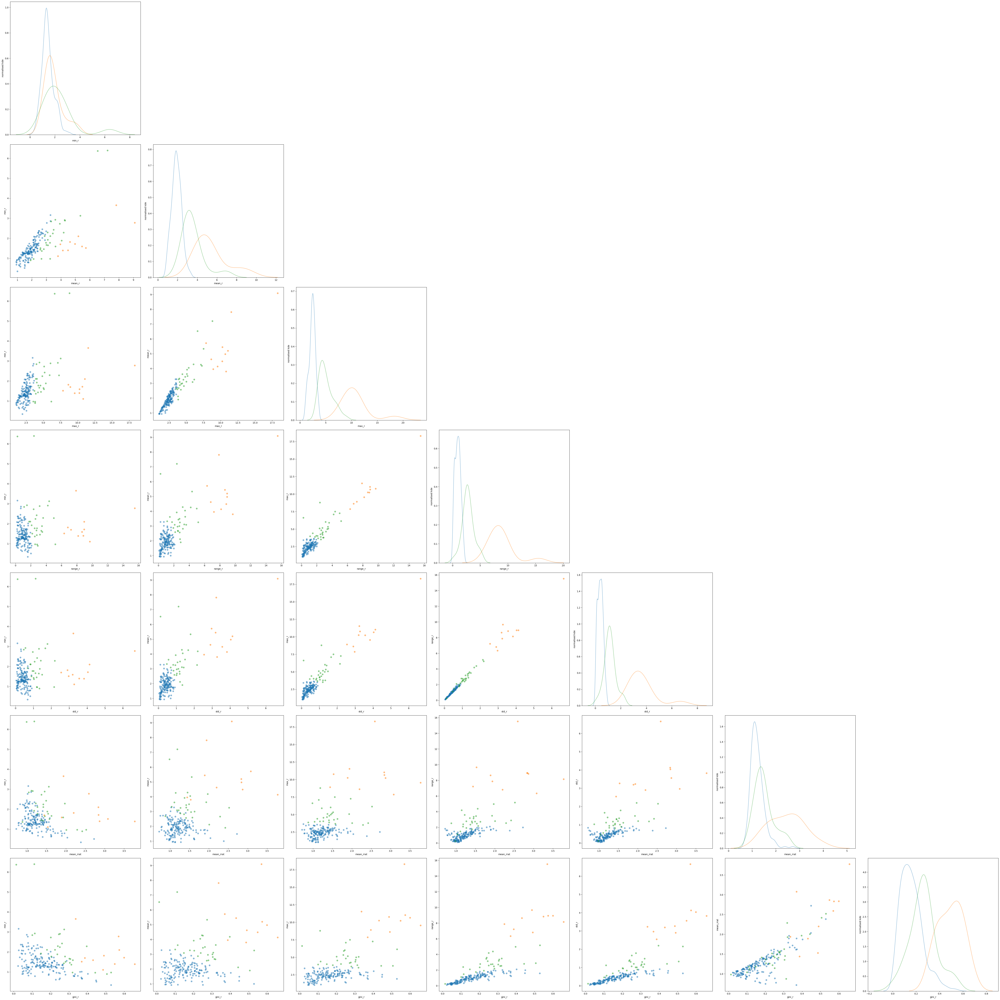

In [55]:
N = len(columns_to_keep)

fig, axes = plt.subplots(N, N, figsize=(60, 60))

# Iterate over each subplot and plot some data
for i in range(N):
    for j in range(N):
        ax=axes[i, j]

        if i<j:
            ax.axis('off')

        if (i>=j):
            I = columns_to_keep[i]
            ax.set_xlabel(I)

        if i == j:
            #histogram
            plt.sca(ax)
            sns.kdeplot(group1[columns_to_keep[i]], label='Group 1', alpha=0.5)
            sns.kdeplot(group2[columns_to_keep[i]], label='Group 2', alpha=0.5)
            sns.kdeplot(group3[columns_to_keep[i]], label='Group 2', alpha=0.5)
            plt.ylabel('normalised kde')

        if i>j:
        
            J = columns_to_keep[j]
            ax.set_ylabel(J)

            ax.scatter(group1[I], group1[J], label='Group 1', alpha=0.5)
            ax.scatter(group2[I], group2[J], label='Group 2', alpha=0.5)
            ax.scatter(group3[I], group3[J], label='Group 3', alpha=0.5)

# Adjust layout
plt.tight_layout()
#N = len(columns_to_keep)
#plt.savefig('Data/kmeans_features_N%s.svg' %str(N-1), format='svg')
#plt.savefig('Data/kmeans_features_N%s.pdf' %str(N-1), format='pdf')
plt.show()